In [2]:
%pylab inline
# Matplotlib default settings
rcdef = plt.rcParams.copy()
pylab.rcParams['figure.figsize'] = 12, 10
pylab.rcParams['xtick.major.size'] = 8.0
pylab.rcParams['xtick.major.width'] = 1.5
pylab.rcParams['xtick.minor.size'] = 4.0
pylab.rcParams['xtick.minor.width'] = 1.5
pylab.rcParams['ytick.major.size'] = 8.0
pylab.rcParams['ytick.major.width'] = 1.5
pylab.rcParams['ytick.minor.size'] = 4.0
pylab.rcParams['ytick.minor.width'] = 1.5
rc('axes', linewidth=2)

import numpy as np
from astropy.io import fits 
from __future__ import division 
from astropy import units as u

import cubehelix  # Cubehelix color scheme from https://github.com/jradavenport/cubehelix
import copy

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


## Parameters that are need to know: 

1. Make sure that correct WCS information is available in the header, or provide the pixel scale in both X and Y direction 
2. The parameters for background estimation in the Cold/Hot SEP run: 
   - bSizeCold/fSizeCold: Sky background size; 
   - bSizeHot / fSizeHot : Sky background filter size
3. The parameters for object detections in the Cold/Hot SEP run (use Cold run as example, replace Cold with Hot for hot run):
   - nSigCold: thrCold = (nSigCold \* bkgC.globalrms); 
   - minDetPixCold: minimum number of pixels for a detection
   - convKerCold: 2-D array for the convolution kernel  
   - deblendThrCold: deblend threshold    **TODO:** Find ways to choose default values of these parameters. 
4. Location and Shape parameters for the galaxy (or galaxies) you want to fit: 
   - galX, galY: The X/Y coordinates in pixel unit 
   - galR: Size of the region dominated by the light from the galaxies 
   - galQ, galPA: Axis ratio and size of the galaxy
5. Increase the size of the mask by how many factors: mskGrowHot / mskGrowCold 


## Optional parameters 

1. contrast for determing the ZSCALE; 
2. options for the Cubehelix: start, rot, gamma
3. skySigClipping: n-sigma clipping for mean sky value
4. coaddExptime / coaddNcombine: Total exposure time and NCombine for "expTime corrected image" option

## Read-in the Data

In [3]:
# Example of cutout image, z~0.4 BCG
#file = 'red_21572_9559_3,7_HSC-I.fits'  
#file = 'red_21572_Icut.fits'  
file = '/Users/songhuang/Downloads/temp/redmapper/example/redmapper_xmm_11049_8522_4,6_HSC-I_full.fits'
data = fits.open(file)

In [4]:
#psfFile = 'hsc_coadd-9559-3,7-HSC-I_psf.fits'
#psfFile = 'red_21572_Ipsf.fits'
psfFile = '/Users/songhuang/Downloads/temp/redmapper/example/redmapper_xmm_11049_8522_4,6_HSC-I_full_psf.fits'
psfData = fits.open(psfFile)

* Right now, the cutout images from HSC is multi-HDU dataset 
* **NOTICE**: The image is not stored in the primary HDU
* The 1/2/3 HDUs are Image/Mask/Variance

In [5]:
# Information and structure of the cutout image
data.info()

Filename: /Users/songhuang/Downloads/temp/redmapper/example/redmapper_xmm_11049_8522_4,6_HSC-I_full.fits
No.    Name         Type      Cards   Dimensions   Format
0    PRIMARY     PrimaryHDU      24   ()              
1    IMAGE       ImageHDU        34   (1601, 1601)   float32   
2    MASK        ImageHDU        47   (1601, 1601)   int16   
3    VARIANCE    ImageHDU        34   (1601, 1601)   float32   
4    ARCHIVE_INDEX  BinTableHDU     40   796R x 7C    [1J, 1J, 1J, 1J, 1J, 64A, 64A]   
5    ARCHIVE_DATA  BinTableHDU     54   8R x 10C     [1J, 1J, 1J, 1J, 1J, 1K, 2J, 2J, 1J, 1D]   
6    ARCHIVE_DATA  BinTableHDU    100   53R x 9C     [2D, 2D, 4D, 72A, 72A, 1D, 72A, 72A, 72A]   
7    ARCHIVE_DATA  BinTableHDU     62   42R x 12C    [1J, 1J, 1J, 1J, 1J, 1K, 2J, 2J, 1J, 1K, 1J, 1D]   
8    ARCHIVE_DATA  BinTableHDU     86   42R x 8C     [1J, 1J, 1J, 1J, 1J, 1J, 2D, 1E]   
9    ARCHIVE_DATA  BinTableHDU     85   42R x 8C     [2J, 1J, 6D, 6D, 3J, 39366E, 2D, 2D]   
10   ARCHIVE_DATA  Bin

In [6]:
img = data[1].data  # Image array 
msk = data[2].data  # Mask plane
var = data[3].data  # Variance array 

sig = np.sqrt(var)  # Change the variance array into sigma image 

In [7]:
# Get the headers
imgHead = data[1].header # Correct WCS information should be included
mskHead = data[2].header
varHead = data[3].header

In [8]:
imgHead # Standard header information

XTENSION= 'IMAGE   '           / IMAGE extension                                
BITPIX  =                  -32 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                 1601 / length of data axis 1                          
NAXIS2  =                 1601 / length of data axis 2                          
PCOUNT  =                    0 / required keyword; must = 0                     
GCOUNT  =                    1 / required keyword; must = 1                     
EQUINOX =                2000. / Equinox of coordinates                         
RADESYS = 'ICRS    '           / Coordinate system for equinox                  
CRPIX1  =                1545. / WCS Coordinate reference pixel                 
CRPIX2  =               -5901. / WCS Coordinate reference pixel                 
CD1_1   = -4.66666666666667E-05 / WCS Coordinate scale matrix                   
CD1_2   =                   

In [9]:
# Get the pixel scale of the image 
try: 
    pixScaleX = (np.abs(imgHead['CD1_1']) * 3600.0)
    pixScaleY = (np.abs(imgHead['CD2_2']) * 3600.0)
except KeyError:
    pixScaleX = pixScaleY = 0.168
else: 
    pixScaleX = pixScaleY = 0.168

print "The pixel scale in X/Y directions are %7.4f / %7.4f arcsecs" % (pixScaleX, pixScaleY)

# Get the image size 
imgSizeX = imgHead['NAXIS1']
imgSizeY = imgHead['NAXIS2']

print "The image size in X/Y directions are %d / %d pixels" % (imgSizeX, imgSizeY)
print "                            %10.2f / %10.2f arcsecs" % (imgSizeX * pixScaleX, imgSizeY * pixScaleY)

The pixel scale in X/Y directions are  0.1680 /  0.1680 arcsecs
The image size in X/Y directions are 1601 / 1601 pixels
                                268.97 /     268.97 arcsecs


## Read in the PSF Image 

* **TODO**: Right now the PSF image is not extracted using the exact coordinate of the galaxy

In [10]:
psfData.info()
imgPSF = psfData[0].data

Filename: /Users/songhuang/Downloads/temp/redmapper/example/redmapper_xmm_11049_8522_4,6_HSC-I_full_psf.fits
No.    Name         Type      Cards   Dimensions   Format
0    PRIMARY     PrimaryHDU      16   (43, 43)     float64   


In [11]:
def zscale(img, contrast=0.25, samples=500):

    # Image scaling function form http://hsca.ipmu.jp/hscsphinx/scripts/psfMosaic.html
    ravel = img.ravel()
    if len(ravel) > samples:
        imsort = np.sort(np.random.choice(ravel, size=samples))
    else:
        imsort = np.sort(ravel)

    n = len(imsort)
    idx = np.arange(n)

    med = imsort[n/2]
    w = 0.25
    i_lo, i_hi = int((0.5-w)*n), int((0.5+w)*n)
    p = np.polyfit(idx[i_lo:i_hi], imsort[i_lo:i_hi], 1)
    slope, intercept = p

    z1 = med - (slope/contrast)*(n/2-n*w)
    z2 = med + (slope/contrast)*(n/2-n*w)

    return z1, z2

## Show the Input Image

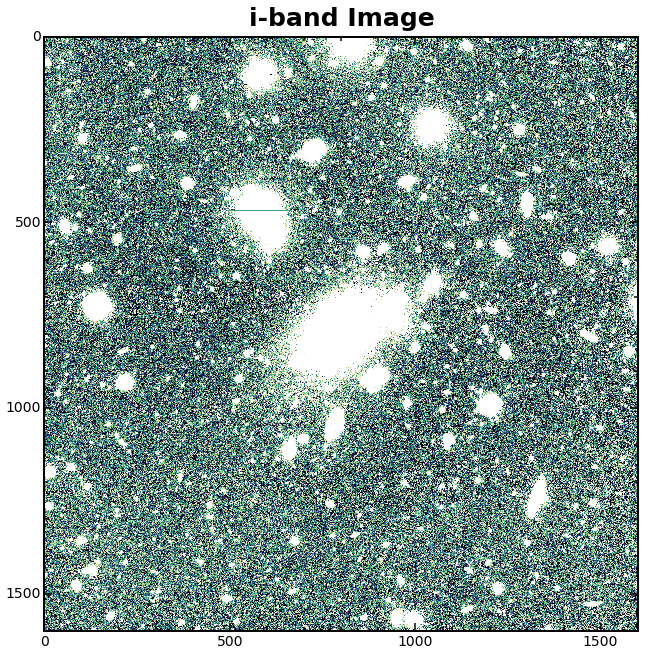

In [12]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
ax.set_title('i-band Image', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

imin, imax = zscale(img, contrast=0.6, samples=500)

ax.imshow(np.arcsinh(img), interpolation="none", 
           vmin=imin, vmax=imax,
           cmap=cubehelix.cmap(start=0.5, rot=-0.8, minSat=1.2, maxSat=1.2, 
                               minLight=0., maxLight=1., gamma=1.0))

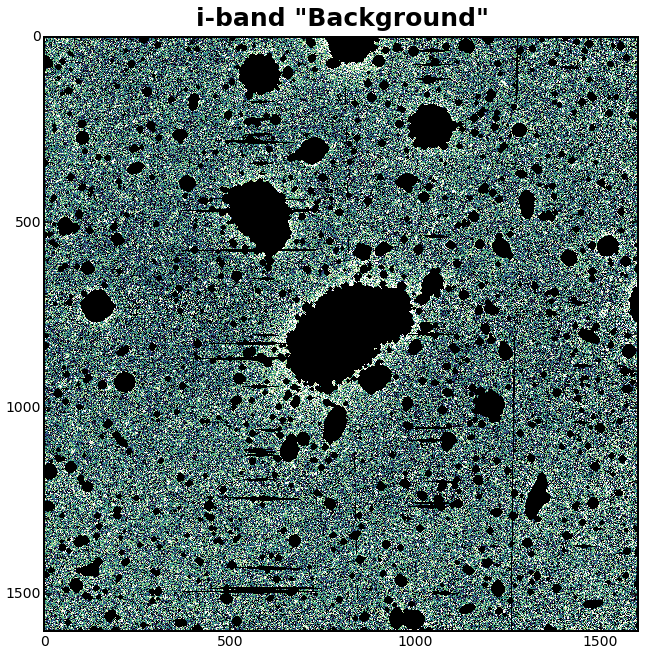

In [13]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
ax.set_title('i-band "Background"', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

imgMsk = copy.deepcopy(img) 
imgMsk[msk > 0] = np.nan 
    
mmin, mmax = zscale(imgMsk, contrast=0.6, samples=500)
cmap = cubehelix.cmap(start=0.5, rot=-0.8, minSat=1.2, maxSat=1.2, 
                      minLight=0., maxLight=1., gamma=1.0)
cmap.set_bad('k',1.)

ax.imshow(np.arcsinh(imgMsk), interpolation="none", 
          vmin=mmin, vmax=mmax, cmap=cmap)

## Show the Mask Plane

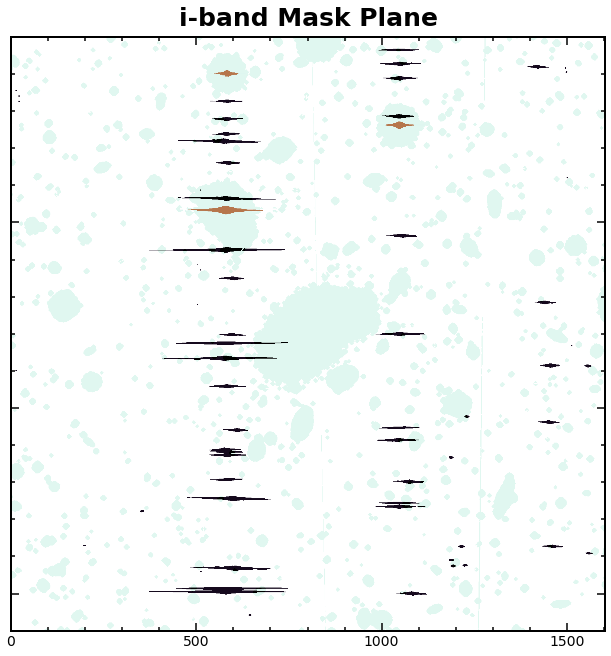

In [14]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
ax.set_title('i-band Mask Plane', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

ax.yaxis.set_major_formatter(plt.NullFormatter())

ax.imshow(msk, cmap=cubehelix.cmap(reverse=True))

## Show the Sigma Image

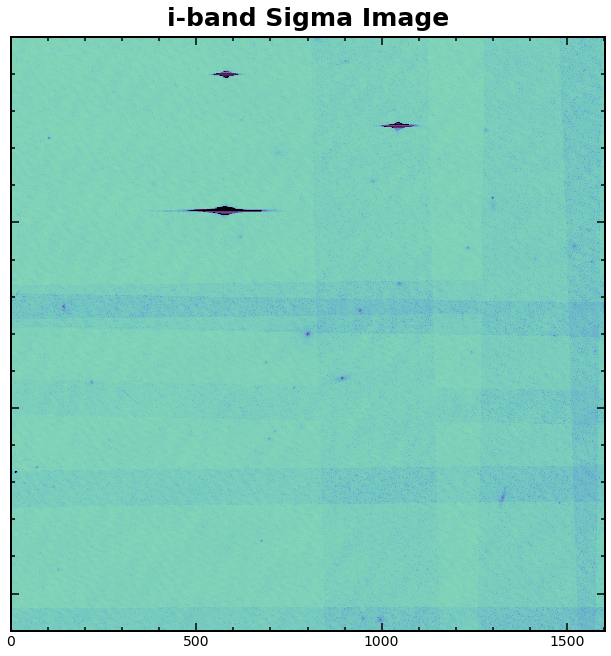

In [15]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
ax.set_title('i-band Sigma Image', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

ax.yaxis.set_major_formatter(plt.NullFormatter())

smin, smax = zscale(sig, contrast=0.03, samples=500)
ax.imshow(np.arcsinh(sig), interpolation="none", 
          vmin=smin, vmax=smax, 
          cmap=cubehelix.cmap(start=0.5, rot=-0.8, reverse=True, minSat=1.2, maxSat=1.2, 
                               minLight=0., maxLight=1., gamma=0.5))

## Show the PSF images

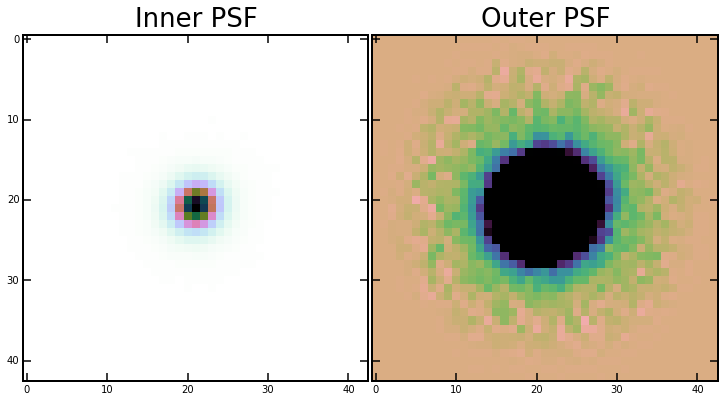

In [16]:
fig, axes = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(10,5))
plt.subplots_adjust(left=0.03, bottom=0.03, right=0.995, top=0.99, 
                    wspace=0.01, hspace=0.01)

# Highlight the Inner part of PSF
pmin, pmax = zscale(imgPSF, contrast=0.05, samples=500)
axes[0].imshow(np.arcsinh(imgPSF), interpolation='none', 
               cmap=cubehelix.cmap(reverse=True, minSat=1.2, maxSat=1.2, 
                                   minLight=0., maxLight=1., gamma=1.0))
axes[0].set_title('Inner PSF', fontsize=26)
axes[0].title.set_position((0.5,1.01))

# Highlight the Outer part of PSF
pmin, pmax = zscale(imgPSF, contrast=0.1, samples=500)
axes[1].imshow(np.arcsinh(imgPSF), interpolation='none', 
               vmin=pmin, vmax=pmax, 
               cmap=cubehelix.cmap(reverse=True, minSat=1.2, maxSat=1.2, 
                                   minLight=0., maxLight=1., gamma=0.5))
axes[1].set_title('Outer PSF', fontsize=26)
axes[1].title.set_position((0.5,1.01))

# Show Image Using APLpy Package

/Users/songhuang/anaconda/lib/python2.7/site-packages/APLpy-2.0.dev832-py2.7.egg/aplpy/labels.py:432: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if self.coord == x or self.axis.apl_tick_positions_world[ipos] > 0:
INFO:astropy:Auto-setting vmin to -6.577e-01
INFO:astropy:Auto-setting vmax to  5.103e+00


INFO: Auto-setting vmin to -6.577e-01 [aplpy.core]
INFO: Auto-setting vmax to  5.103e+00 [aplpy.core]


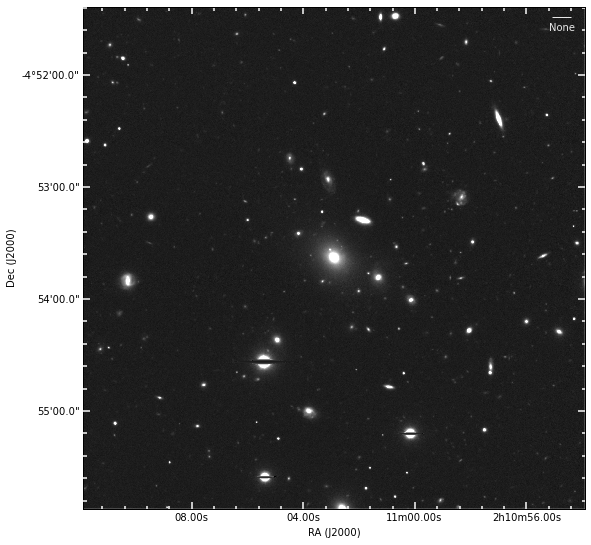

In [17]:
# Try ApLPY 
import aplpy 
fig = aplpy.FITSFigure(file, hdu=1)
fig.show_grayscale(interpolation='none')
#fig.add_label(133.4737, 1.3449933, 'BCG', color='w')
#fig.add_label(0.1, 0.9, '(a)', relative=True, color='w', size=25)
#fig.show_ellipses(133.4737, 1.3449933, 0.02, 0.03, color='y')

#fig.add_grid()

fig.add_scalebar(0.05)
fig.scalebar.set_length(10 * u.arcsecond)
fig.scalebar.set_label('10 asec')
fig.scalebar.set_corner('top right')
fig.scalebar.set_alpha(0.9)
fig.scalebar.set_color('white')

# Histogram for Pixels without Any Mask

In [18]:
from astropy.stats import sigma_clip

indNoMask = np.where(msk == 0)
skySigClipping = 3.0

pixNoMask = sigma_clip(img[indNoMask].flatten(), skySigClipping, 3)
pixAll    = img.flatten()

In [19]:
imgQ1, imgQ2, imgQ3, imgQ4 = img[0:800, 0:800], img[0:800,801:1601], img[801:1601, 801:1601], img[801:1601, 0:800]
mskQ1, mskQ2, mskQ3, mskQ4 = msk[0:800, 0:800], msk[0:800,801:1601], msk[801:1601, 801:1601], msk[801:1601, 0:800]
indQ1, indQ2, indQ3, indQ4 = np.where(mskQ1 == 0), np.where(mskQ2 == 0), np.where(mskQ3 == 0), np.where(mskQ4 == 0) 
pixQ1 = sigma_clip(imgQ1[indQ1].flatten(), skySigClipping, 3)
pixQ2 = sigma_clip(imgQ2[indQ2].flatten(), skySigClipping, 3)
pixQ3 = sigma_clip(imgQ3[indQ3].flatten(), skySigClipping, 3)
pixQ4 = sigma_clip(imgQ4[indQ4].flatten(), skySigClipping, 3)

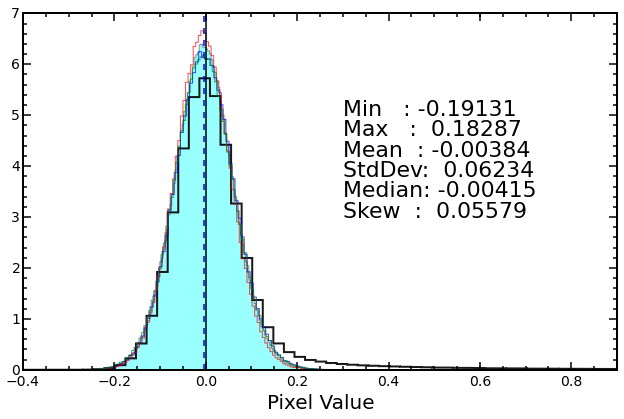

In [20]:
from astroML.plotting import hist
import scipy 

fig = plt.figure(figsize=(10, 6))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

ax.set_xlim(-0.7, 1.0)

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)

counts1, bins2, patches3 = hist(pixNoMask, bins='knuth', ax=ax, alpha=0.4, 
                                color='cyan', histtype='stepfilled', normed=True)
counts1, bins2, patches3 = hist(pixAll,  bins='knuth', ax=ax, alpha=0.9, 
                                color='k', histtype='step', normed=True, linewidth=2)
counts1, bins2, patches3 = hist(pixQ1,  bins='knuth', ax=ax, alpha=0.7, 
                                color='r', histtype='step', normed=True, linewidth=1)
counts1, bins2, patches3 = hist(pixQ2,  bins='knuth', ax=ax, alpha=0.7, 
                                color='b', histtype='step', normed=True, linewidth=1)
counts1, bins2, patches3 = hist(pixQ3,  bins='knuth', ax=ax, alpha=0.7, 
                                color='g', histtype='step', normed=True, linewidth=1)

ax.axvline(0.0, linestyle='-', color='k', linewidth=1.5)
ax.axvline(np.nanmedian(pixNoMask), linestyle='--', color='b', linewidth=1.5)

ax.set_xlabel('Pixel Value', fontsize=20)
ax.set_xlim(-0.4, 0.9)

ax.text(0.3, 5.0, "Min   : %8.5f" % np.nanmin(pixNoMask),  fontsize=22)
ax.text(0.3, 4.6, "Max   : %8.5f" % np.nanmax(pixNoMask),  fontsize=22)
ax.text(0.3, 4.2, "Mean  : %8.5f" % np.nanmean(pixNoMask), fontsize=22)
ax.text(0.3, 3.8, "StdDev: %8.5f" % np.nanstd(pixNoMask),  fontsize=22)
ax.text(0.3, 3.4, "Median: %8.5f" % np.nanmedian(pixNoMask),  fontsize=22)
ax.text(0.3, 3.0, "Skew  : %8.5f" % scipy.stats.skew(pixNoMask),  fontsize=22)

In [21]:
import numpy as n
import scipy.interpolate
import scipy.ndimage

# Based on: http://wiki.scipy.org/Cookbook/Rebinning
def congrid(a, newdims, method='linear', centre=False, minusone=False):
    '''Arbitrary resampling of source array to new dimension sizes.
    Currently only supports maintaining the same number of dimensions.
    To use 1-D arrays, first promote them to shape (x,1).
    
    Uses the same parameters and creates the same co-ordinate lookup points
    as IDL''s congrid routine, which apparently originally came from a VAX/VMS
    routine of the same name.

    method:
    neighbour - closest value from original data
    nearest and linear - uses n x 1-D interpolations using
                         scipy.interpolate.interp1d
    (see Numerical Recipes for validity of use of n 1-D interpolations)
    spline - uses ndimage.map_coordinates

    centre:
    True - interpolation points are at the centres of the bins
    False - points are at the front edge of the bin

    minusone:
    For example- inarray.shape = (i,j) & new dimensions = (x,y)
    False - inarray is resampled by factors of (i/x) * (j/y)
    True - inarray is resampled by(i-1)/(x-1) * (j-1)/(y-1)
    This prevents extrapolation one element beyond bounds of input array.
    '''
    if not a.dtype in [n.float64, n.float32]:
        a = n.cast[float](a)

    m1 = n.cast[int](minusone)
    ofs = n.cast[int](centre) * 0.5
    old = n.array( a.shape )
    ndims = len( a.shape )
    if len( newdims ) != ndims:
        print "[congrid] dimensions error. " \
              "This routine currently only support " \
              "rebinning to the same number of dimensions."
        return None
    newdims = n.asarray( newdims, dtype=float )
    dimlist = []

    if method == 'neighbour':
        for i in range( ndims ):
            base = n.indices(newdims)[i]
            dimlist.append( (old[i] - m1) / (newdims[i] - m1) \
                            * (base + ofs) - ofs )
        cd = n.array( dimlist ).round().astype(int)
        newa = a[list( cd )]
        return newa

    elif method in ['nearest','linear']:
        # calculate new dims
        for i in range( ndims ):
            base = n.arange( newdims[i] )
            dimlist.append( (old[i] - m1) / (newdims[i] - m1) \
                            * (base + ofs) - ofs )
        # specify old dims
        olddims = [n.arange(i, dtype = n.float) for i in list( a.shape )]

        # first interpolation - for ndims = any
        mint = scipy.interpolate.interp1d( olddims[-1], a, kind=method )
        newa = mint( dimlist[-1] )

        trorder = [ndims - 1] + range( ndims - 1 )
        for i in range( ndims - 2, -1, -1 ):
            newa = newa.transpose( trorder )

            mint = scipy.interpolate.interp1d( olddims[i], newa, kind=method )
            newa = mint( dimlist[i] )

        if ndims > 1:
            # need one more transpose to return to original dimensions
            newa = newa.transpose( trorder )

        return newa
    elif method in ['spline']:
        oslices = [ slice(0,j) for j in old ]
        oldcoords = n.ogrid[oslices]
        nslices = [ slice(0,j) for j in list(newdims) ]
        newcoords = n.mgrid[nslices]

        newcoords_dims = range(n.rank(newcoords))
        #make first index last
        newcoords_dims.append(newcoords_dims.pop(0))
        newcoords_tr = newcoords.transpose(newcoords_dims)
        # makes a view that affects newcoords

        newcoords_tr += ofs

        deltas = (n.asarray(old) - m1) / (newdims - m1)
        newcoords_tr *= deltas

        newcoords_tr -= ofs

        newa = scipy.ndimage.map_coordinates(a, newcoords)
        return newa
    else:
        print "Congrid error: Unrecognized interpolation type.\n", \
              "Currently only \'neighbour\', \'nearest\',\'linear\',", \
              "and \'spline\' are supported."
        return None

In [30]:
newImg = copy.deepcopy(img)
newMsk = copy.deepcopy(msk)

imgBin1 = congrid(newImg, (400, 400), method='spline')
mskBin1 = congrid(newMsk, (400, 400), method='spline')

/Users/songhuang/anaconda/lib/python2.7/site-packages/numpy/core/fromnumeric.py:2507: VisibleDeprecationWarning: `rank` is deprecated; use the `ndim` attribute or function instead. To find the rank of a matrix see `numpy.linalg.matrix_rank`.
  VisibleDeprecationWarning)


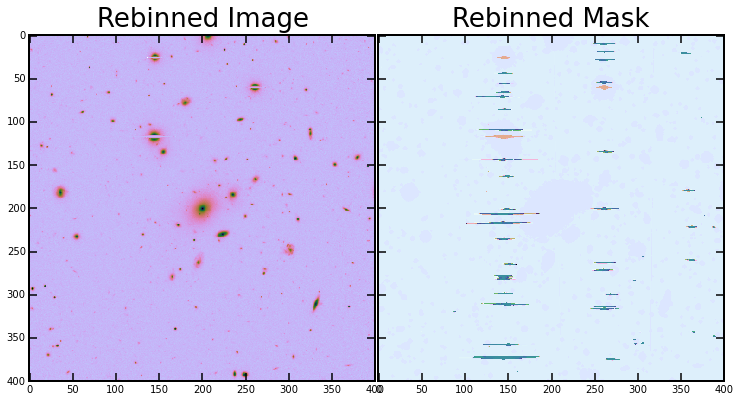

In [31]:
fig, axes = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(10,5))
plt.subplots_adjust(left=0.03, bottom=0.03, right=0.995, top=0.99, 
                    wspace=0.01, hspace=0.01)

# Highlight the Inner part of PSF
pmin, pmax = zscale(imgBin1, contrast=0.05, samples=500)
axes[0].imshow(np.arcsinh(imgBin1), interpolation='none', 
               cmap=cubehelix.cmap(reverse=True, minSat=1.2, maxSat=1.2, 
                                   minLight=0., maxLight=1., gamma=1.0))
axes[0].set_title('Rebinned Image', fontsize=26)
axes[0].title.set_position((0.5,1.01))

# Highlight the Outer part of PSF
axes[1].imshow(mskBin1, interpolation='none', 
               cmap=cubehelix.cmap(reverse=True, minSat=1.2, maxSat=1.2, 
                                   minLight=0., maxLight=1., gamma=0.5))
axes[1].set_title('Rebinned Mask', fontsize=26)
axes[1].title.set_position((0.5,1.01))

In [32]:
indNoMaskBin1 = np.where(mskBin1 == 0)

pixNoMaskBin1 = sigma_clip(imgBin1[indNoMaskBin1].flatten(), skySigClipping, 3)
pixAllBin2    = imgBin1.flatten()

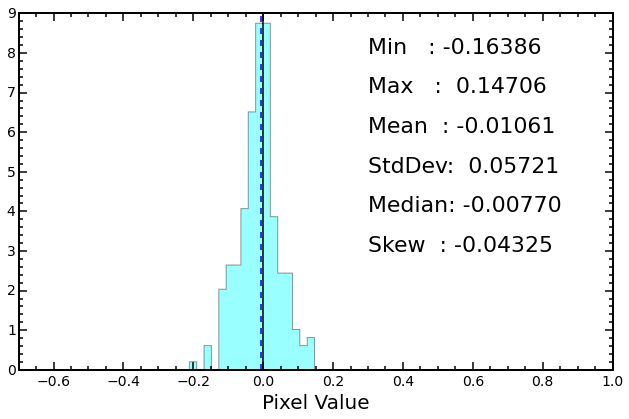

In [33]:
from astroML.plotting import hist
import scipy 

fig = plt.figure(figsize=(10, 6))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

ax.set_xlim(-0.7, 1.0)

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)

counts1, bins2, patches3 = hist(pixNoMaskBin1, bins='knuth', ax=ax, alpha=0.4, 
                                color='cyan', histtype='stepfilled', normed=True)
#counts1, bins2, patches3 = hist(pixAllNew,  bins='knuth', ax=ax, alpha=0.9, 
#                                color='k', histtype='step', normed=True, linewidth=2)


ax.axvline(0.0, linestyle='-', color='k', linewidth=1.5)
ax.axvline(np.nanmedian(pixNoMaskBin1), linestyle='--', color='b', linewidth=1.5)

ax.set_xlabel('Pixel Value', fontsize=20)
#ax.set_xlim(-0.4, 0.9)

ax.text(0.3, 8.0, "Min   : %8.5f" % np.nanmin(pixNoMaskBin1),  fontsize=22)
ax.text(0.3, 7.0, "Max   : %8.5f" % np.nanmax(pixNoMaskBin1),  fontsize=22)
ax.text(0.3, 6.0, "Mean  : %8.5f" % np.nanmean(pixNoMaskBin1), fontsize=22)
ax.text(0.3, 5.0, "StdDev: %8.5f" % np.nanstd(pixNoMaskBin1),  fontsize=22)
ax.text(0.3, 4.0, "Median: %8.5f" % np.nanmedian(pixNoMaskBin1),  fontsize=22)
ax.text(0.3, 3.0, "Skew  : %8.5f" % scipy.stats.skew(pixNoMaskBin1),  fontsize=22)

# Making Object Mask for the Central Galaxy

## Use the SEP.background to re-estimate the background of the image

In [34]:
import sep

bSizeCold = 80
fSizeCold = 20

bSizeHot  =  8
fSizeHot  =  4

imgC = copy.deepcopy(img)
imgC = imgC.byteswap(True).newbyteorder()

imgH = copy.deepcopy(img)
imgH = imgH.byteswap(True).newbyteorder()

bkgC = sep.Background(imgC, None, bSizeCold, bSizeCold, 
                     fSizeCold, fSizeCold)
bkgH = sep.Background(imgH, None, bSizeHot, bSizeHot, 
                     fSizeHot, fSizeHot)

globalBkgC = bkgC.globalback
globalRmsC = bkgC.globalrms

globalBkgH = bkgH.globalback
globalRmsH = bkgH.globalrms

## Show the new "Background"

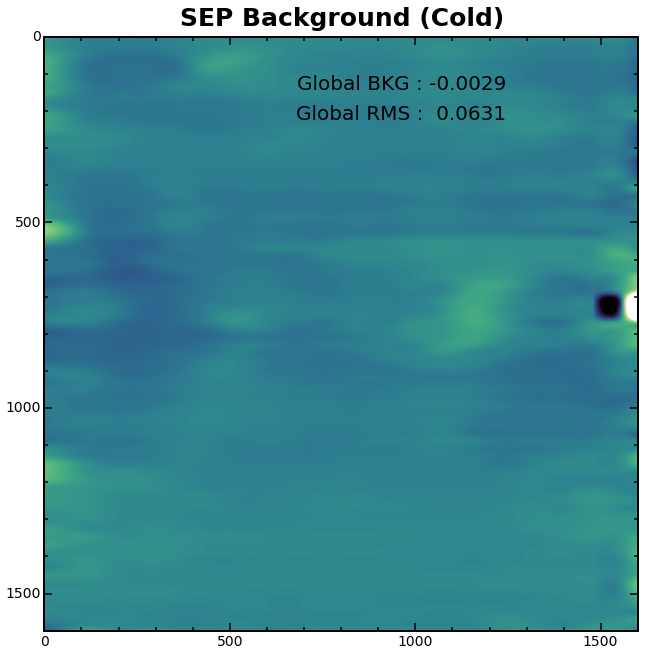

In [35]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
ax.set_title('SEP Background (Cold)', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

cmap = cubehelix.cmap(start=0.5, rot=-0.8, minSat=1.2, maxSat=1.2, 
                      minLight=0., maxLight=1., gamma=1.0)
cmap.set_bad('k',1.)

ax.imshow(np.arcsinh(bkgC.back()), interpolation="none", 
          vmin=mmin, vmax=mmax, cmap=cmap)
ax.text(0.6, 0.92, "Global BKG : %7.4f" % globalBkgC, 
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax.transAxes, fontsize=20)
ax.text(0.6, 0.87, "Global RMS : %7.4f" % globalRmsC, 
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax.transAxes, fontsize=20)

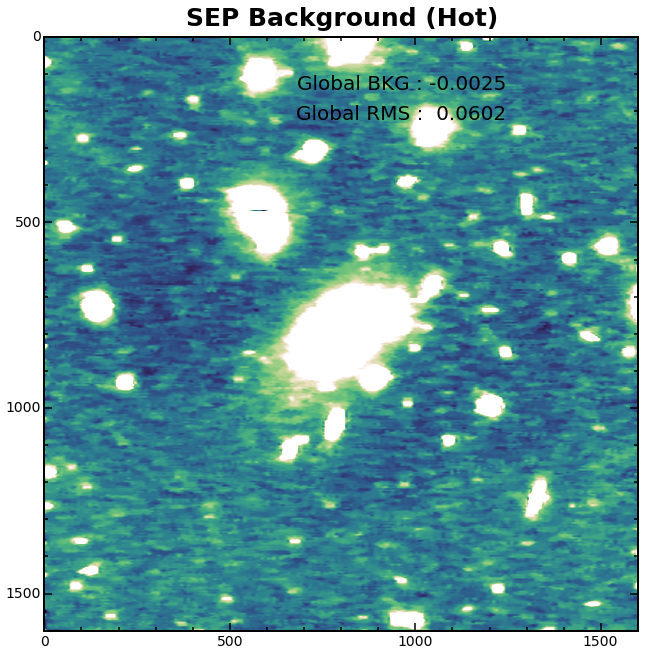

In [36]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
ax.set_title('SEP Background (Hot)', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

cmap = cubehelix.cmap(start=0.5, rot=-0.8, minSat=1.2, maxSat=1.2, 
                      minLight=0., maxLight=1., gamma=1.0)
cmap.set_bad('k',1.)

ax.imshow(np.arcsinh(bkgH.back()), interpolation="none", 
          vmin=mmin, vmax=mmax, cmap=cmap)
ax.text(0.6, 0.92, "Global BKG : %7.4f" % globalBkgH, 
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax.transAxes, fontsize=20)
ax.text(0.6, 0.87, "Global RMS : %7.4f" % globalRmsH, 
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax.transAxes, fontsize=20)

## Subtract that "Background" from the Original Image

In [37]:
bkgC.subfrom(imgC) 
bkgH.subfrom(imgH)

In [38]:
def getEll2Plot(objects, radius=None): 
    
    from matplotlib.patches import Ellipse
    
    x  = objects['x'].copy()
    y  = objects['y'].copy()
    pa = objects['theta'].copy() # in unit of radian

    if radius is not None: 
        a = radius.copy()
        b = radius.copy()*(objects['b'].copy()/objects['a'].copy())
    else: 
        a  = objects['a'].copy()
        b  = objects['b'].copy()
    
    ells = [Ellipse(xy=np.array([x[i], y[i]]), 
                    width=np.array(2.0 * b[i]), 
                    height=np.array(2.0 * a[i]), 
                    angle=np.array(pa[i]*180.0/np.pi + 90.0)) 
            for i in range(x.shape[0])]
    
    return ells

# Object Detection

## The Low-Threshold Cold Run

In [39]:
nSigCold       = 1.5
thrCold        = (nSigCold * bkgC.globalrms)
minDetPixCold  = 5
# Tophat_3.0_3x3
convKerCold    = np.asarray([[0.560000, 0.980000, 0.560000], 
                             [0.980000, 1.000000, 0.980000],
                             [0.560000, 0.980000, 0.560000]])
deblendThrCold = 20
deblendConCold = 0.002

objCold = sep.extract(imgC, thrCold, minarea=minDetPixCold, 
                      conv=convKerCold, deblend_nthresh=deblendThrCold, 
                      deblend_cont=deblendConCold)

In [40]:
xCold  = objCold['x'].copy()
yCold  = objCold['y'].copy()
aCold  = objCold['a'].copy()
bCold  = objCold['b'].copy()
paCold = objCold['theta'].copy()
fluxCold = objCold['cflux'].copy()

numCold = xCold.shape[0]
print "%d objects are detected in the cold run" % numCold

# TODO: For some reasons, the Kron radius does not work?
radKronCold, flagKronCold = sep.kron_radius(imgC, xCold, yCold, 
                                            aCold, bCold, paCold, 
                                            np.empty(numCold).fill(6), 
                                            mask=None, maskthresh=0.0)

1233 objects are detected in the cold run


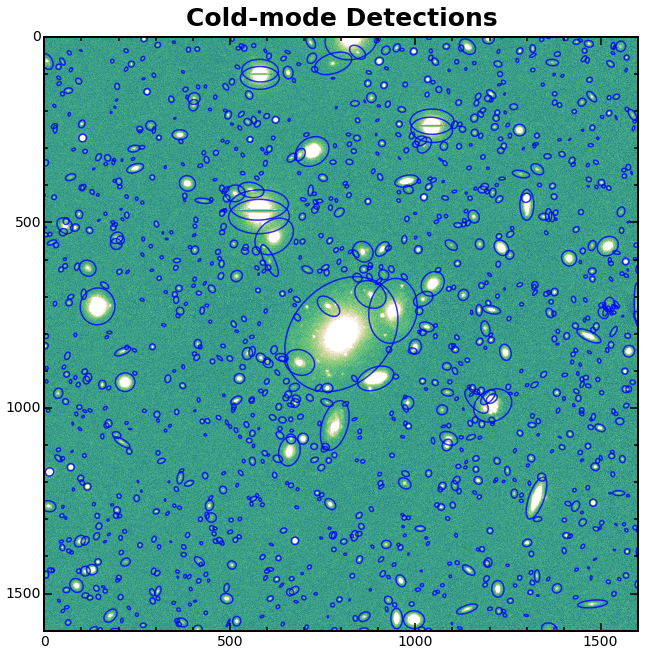

In [41]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    
ax.set_title('Cold-mode Detections', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

imin, imax = zscale(imgC, contrast=0.05, samples=500)

ax.imshow(np.arcsinh(imgC), interpolation="none", 
           vmin=imin, vmax=imax,
           cmap=cubehelix.cmap(start=0.5, rot=-0.8, minSat=1.2, maxSat=1.2, 
                               minLight=0., maxLight=1., gamma=1.0))
ellsCold = getEll2Plot(objCold, radius=(aCold*4.0))

for e in ellsCold:
    ax.add_artist(e)
    e.set_clip_box(ax.bbox)
    e.set_alpha(0.8)
    e.set_edgecolor('b')
    e.set_facecolor('none')
    e.set_linewidth(1.5)

## The High-Threshold Hot Run

In [48]:
nSigHot       = 3.5
thrHot        = (nSigHot * bkgH.globalrms)
minDetPixHot  = 6
# Tophat_3.0_3x3
convKerHot    = np.asarray([[0.560000, 0.980000, 0.560000], 
                            [0.980000, 1.000000, 0.980000],
                            [0.560000, 0.980000, 0.560000]])
deblendThrHot = 24
deblendConHot = 0.005

objHot = sep.extract(imgH, thrHot, minarea=minDetPixHot, 
                     conv=convKerHot, deblend_nthresh=deblendThrHot, 
                     deblend_cont=deblendConHot)

In [49]:
xHot   = objHot['x'].copy()
yHot   = objHot['y'].copy()
aHot   = objHot['a'].copy()
bHot   = objHot['b'].copy()
paHot  = objHot['theta'].copy()
fluxHot = objHot['cflux'].copy()

numHot = xHot.shape[0]
print "%d objects are detected in the hot run" % numHot

592 objects are detected in the hot run


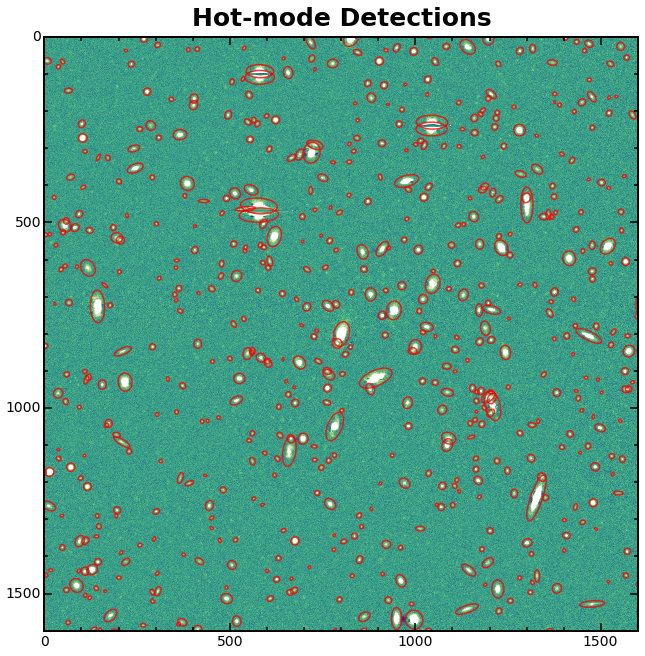

In [50]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    
ax.set_title('Hot-mode Detections', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

imin, imax = zscale(imgH, contrast=0.05, samples=500)

ax.imshow(np.arcsinh(imgH), interpolation="none", 
           vmin=imin, vmax=imax,
           cmap=cubehelix.cmap(start=0.5, rot=-0.8, minSat=1.2, maxSat=1.2, 
                               minLight=0., maxLight=1., gamma=1.0))
ellsHot = getEll2Plot(objHot, radius=(aHot*5.0))

for e in ellsHot:
    ax.add_artist(e)
    e.set_clip_box(ax.bbox)
    e.set_alpha(0.8)
    e.set_edgecolor('r')
    e.set_facecolor('none')
    e.set_linewidth(1.5)

# Making Object Mask Image

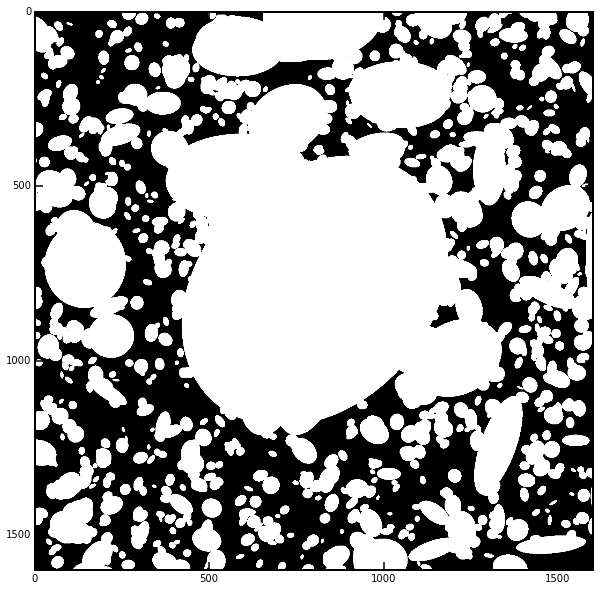

In [52]:
objMskCold = np.zeros(shape(imgC), dtype = uint8)
sep.mask_ellipse(objMskCold, xCold, yCold, aCold, bCold, paCold, r=10.0)

plt.imshow(objMskCold, cmap='gray')

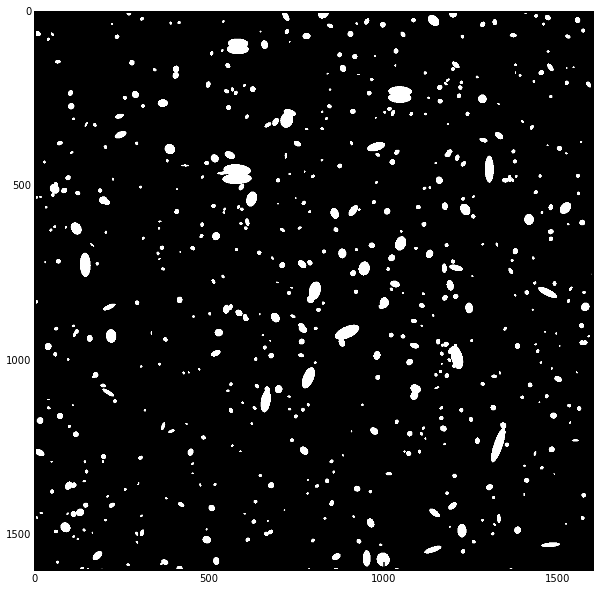

In [53]:
objMskHot = np.zeros(shape(imgH), dtype = uint8)
sep.mask_ellipse(objMskHot, xHot, yHot, aHot, bHot, paHot, r=4.0)

plt.imshow(objMskHot, cmap='gray')

## Remove the Central Galaxy from the Mask Array

In [58]:
galX  = 800.5
galY  = 800.5 
galR1 = 15.0
galR2 = 250.0    # Radius of the galaxy 
galQ  = 0.75     # Axis Ratio of the galaxy 
galPA = -35.0    # Position angle of the galaxy

In [60]:
objColdNew = copy.deepcopy(objCold) 
objWarmNew = copy.deepcopy(objCold)
objHotNew  = copy.deepcopy(objHot) 

galCenDistCold = np.sqrt((xCold - galX)**2 + (yCold - galY)**2)  # Distance between detected objects 
galCenDistHot  = np.sqrt((xHot  - galX)**2 + (yHot  - galY)**2)  #   and the target

objColdNew = np.delete(objColdNew, np.where(galCenDistCold <= galR2))  # Clear the central region 
objWarmNew = np.delete(objWarmNew, np.where(galCenDistCold <= galR1))  # TODO: 
#objColdNew = np.delete(objColdNew, np.argmin(galCenDistCold))  # Remove the one with the smallest distance 

objHotNew  = np.delete(objHotNew,  np.argmin(galCenDistHot))   # Remove the one with the smallest distance

print "Cold Mode: %d --> %d" % (objCold.shape[0], objColdNew.shape[0])
print "Warm Mode: %d --> %d" % (objCold.shape[0], objWarmNew.shape[0])
print "Hot  Mode: %d --> %d" % (objHot.shape[0],  objHotNew.shape[0])

Cold Mode: 1233 --> 1161
Warm Mode: 1233 --> 1232
Hot  Mode: 592 --> 591


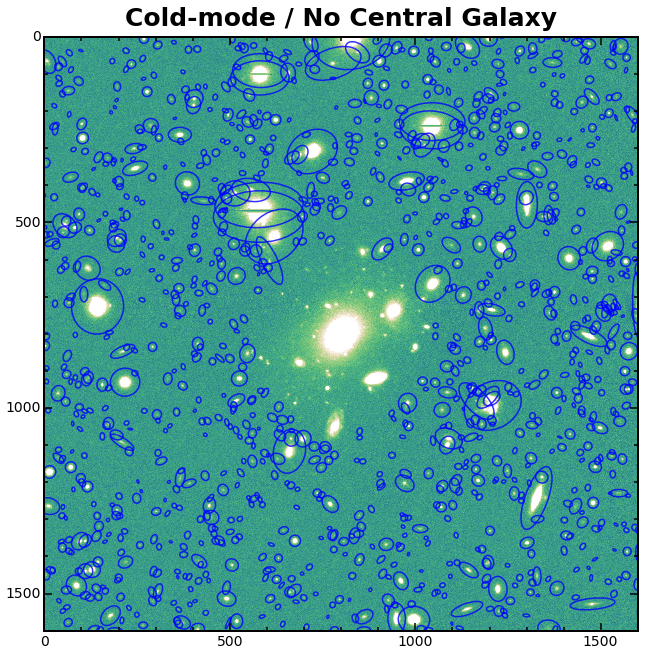

In [63]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    
ax.set_title('Cold-mode / No Central Galaxy', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

imin, imax = zscale(imgC, contrast=0.05, samples=500)

ax.imshow(np.arcsinh(imgC), interpolation="none", 
           vmin=imin, vmax=imax,
           cmap=cubehelix.cmap(start=0.5, rot=-0.8, minSat=1.2, maxSat=1.2, 
                               minLight=0., maxLight=1., gamma=1.0))
ellsCold = getEll2Plot(objColdNew, radius=(objColdNew['a']*6.0))

for e in ellsCold:
    ax.add_artist(e)
    e.set_clip_box(ax.bbox)
    e.set_alpha(0.8)
    e.set_edgecolor('b')
    e.set_facecolor('none')
    e.set_linewidth(1.5)

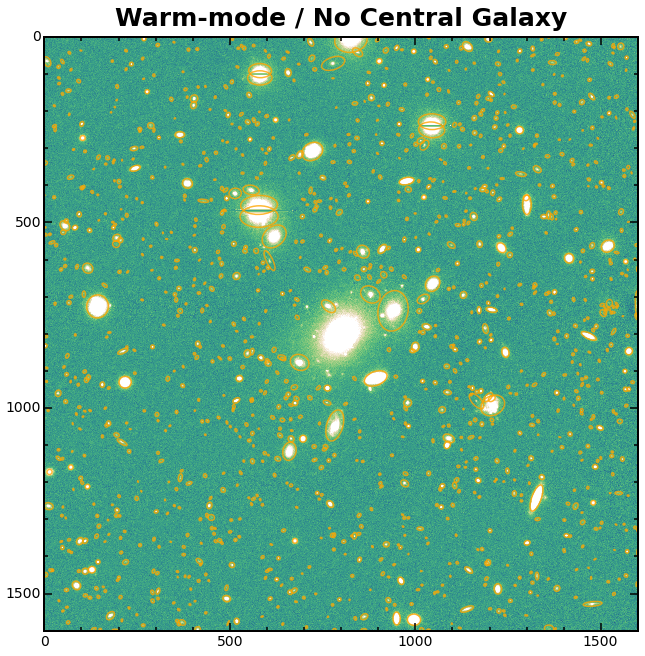

In [66]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    
ax.set_title('Warm-mode / No Central Galaxy', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

imin, imax = zscale(imgC, contrast=0.05, samples=500)

ax.imshow(np.arcsinh(imgC), interpolation="none", 
           vmin=imin, vmax=imax,
           cmap=cubehelix.cmap(start=0.5, rot=-0.8, minSat=1.2, maxSat=1.2, 
                               minLight=0., maxLight=1., gamma=1.0))
ellsWarm = getEll2Plot(objWarmNew, radius=(objWarmNew['a']*2.5))

for e in ellsWarm:
    ax.add_artist(e)
    e.set_clip_box(ax.bbox)
    e.set_alpha(0.8)
    e.set_edgecolor('orange')
    e.set_facecolor('none')
    e.set_linewidth(1.5)

* Bright object around central galaxy can still be detected in the cold mode
* To make the size of the mask large enough for most objects, the masks for objects close to central galaxy might get too large in the colde mode 
* **TODO**: Need a better scheme to increase the size of mask 
* **Work Around**: Remove all masks within certain radius of the central galaxies in the colde mode

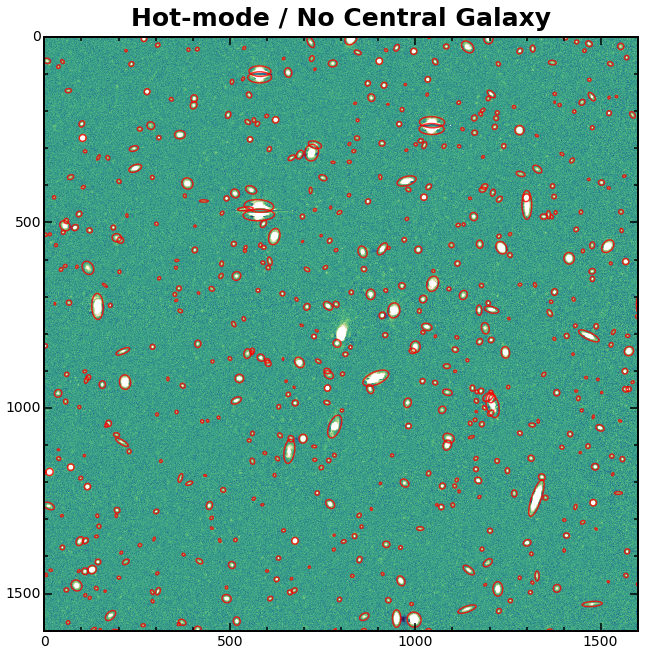

In [67]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    
ax.set_title('Hot-mode / No Central Galaxy', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

imin, imax = zscale(imgH, contrast=0.05, samples=500)

ax.imshow(np.arcsinh(imgH), interpolation="none", 
           vmin=imin, vmax=imax,
           cmap=cubehelix.cmap(start=0.5, rot=-0.8, minSat=1.2, maxSat=1.2, 
                               minLight=0., maxLight=1., gamma=1.0))
ellsHot = getEll2Plot(objHotNew, radius=(objHotNew['a']*4.0))

for e in ellsHot:
    ax.add_artist(e)
    e.set_clip_box(ax.bbox)
    e.set_alpha(0.8)
    e.set_edgecolor('r')
    e.set_facecolor('none')
    e.set_linewidth(1.5)

## Combine the Masks 

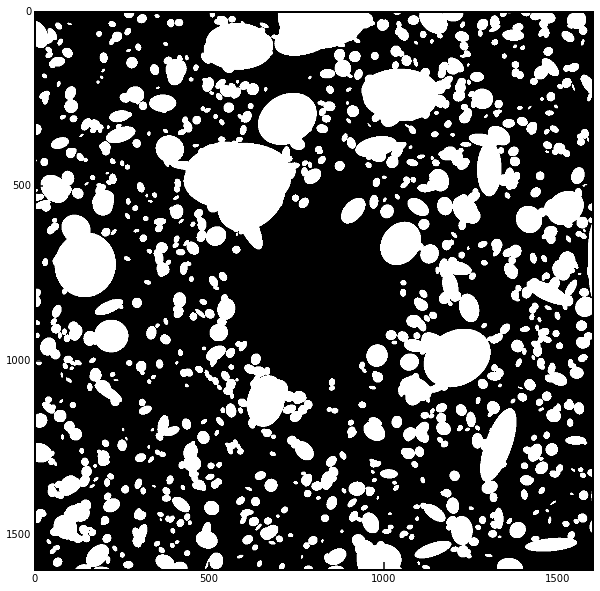

In [74]:
mskGrowCold = 7.5  # 

objMskColdNew = np.zeros(shape(imgC), dtype = uint8)
xColdNew  = objColdNew['x'].copy()
yColdNew  = objColdNew['y'].copy()
aColdNew  = objColdNew['a'].copy()
bColdNew  = objColdNew['b'].copy()
paColdNew = objColdNew['theta'].copy()

sep.mask_ellipse(objMskColdNew, xColdNew, yColdNew, 
                 aColdNew, bColdNew, paColdNew, r=mskGrowCold)

plt.imshow(objMskColdNew, cmap='gray')

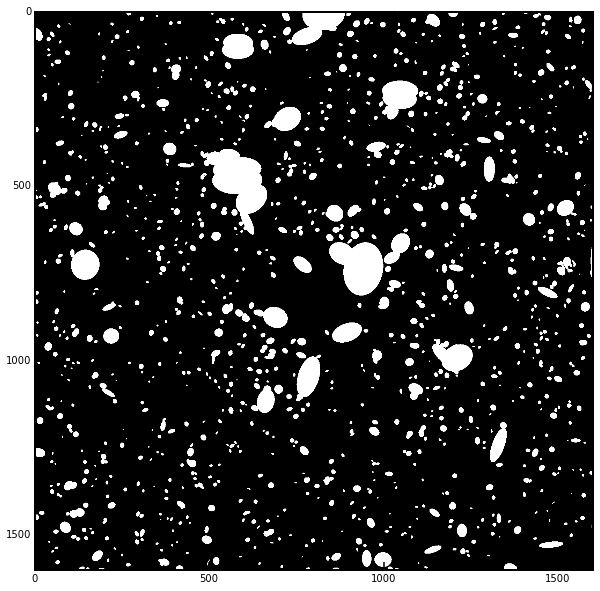

In [75]:
mskGrowWarm = 3.5  # 

objMskWarmNew = np.zeros(shape(imgC), dtype = uint8)
xWarmNew  = objWarmNew['x'].copy()
yWarmNew  = objWarmNew['y'].copy()
aWarmNew  = objWarmNew['a'].copy()
bWarmNew  = objWarmNew['b'].copy()
paWarmNew = objWarmNew['theta'].copy()

sep.mask_ellipse(objMskWarmNew, xWarmNew, yWarmNew, 
                 aWarmNew, bWarmNew, paWarmNew, r=mskGrowWarm)

plt.imshow(objMskWarmNew, cmap='gray')

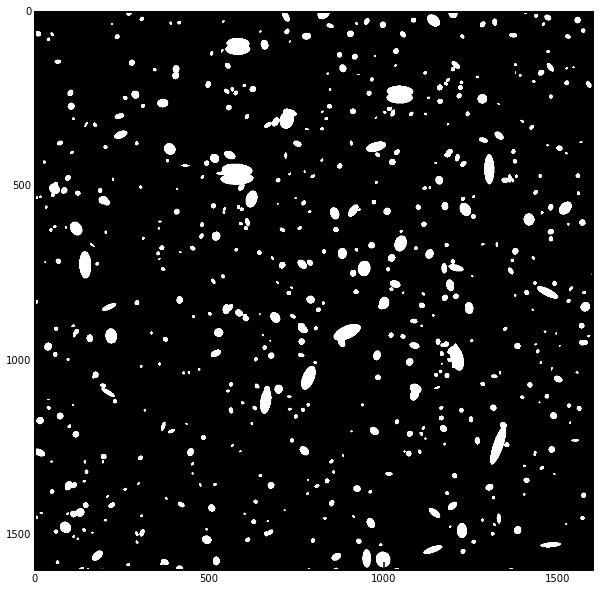

In [76]:
mskGrowHot = 4.5  # 

objMskHotNew = np.zeros(shape(imgH), dtype = uint8)
xHotNew  = objHotNew['x'].copy()
yHotNew  = objHotNew['y'].copy()
aHotNew  = objHotNew['a'].copy()
bHotNew  = objHotNew['b'].copy()
paHotNew = objHotNew['theta'].copy()

sep.mask_ellipse(objMskHotNew, xHotNew, yHotNew, 
                 aHotNew, bHotNew, paHotNew, r=mskGrowHot)

plt.imshow(objMskHotNew, cmap='gray')

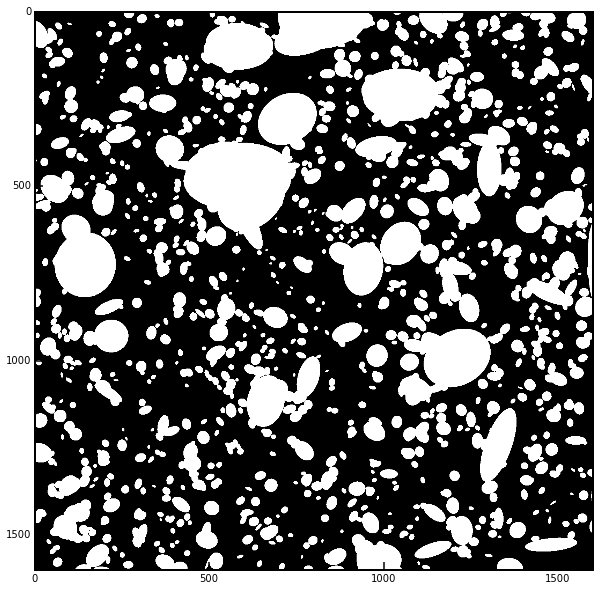

In [77]:
objMskComb = (objMskColdNew | objMskWarmNew | objMskHotNew)   # Combine the two mask 

plt.imshow(objMskComb, cmap='gray')

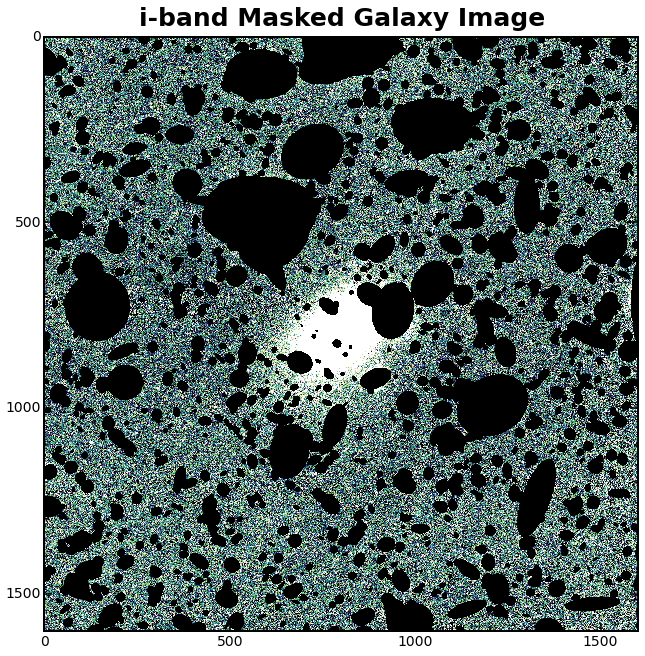

In [78]:
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(hspace=0.1, wspace=0.1,
                    top=0.95, right=0.95)
ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
ax.set_title('i-band Masked Galaxy Image', fontsize=25, fontweight='bold')
ax.title.set_position((0.5,1.01))

galMsk = copy.deepcopy(img)
mmin, mmax = zscale(galMsk, contrast=0.6, samples=500)

galMsk[objMskComb > 0] = np.nan 
    
cmap = cubehelix.cmap(start=0.5, rot=-0.8, minSat=1.2, maxSat=1.2, 
                      minLight=0., maxLight=1., gamma=1.0)
cmap.set_bad('k',1.)

ax.imshow(np.arcsinh(galMsk), interpolation="none", 
          vmin=mmin, vmax=mmax, cmap=cmap)

# Save the Input Image, Object Mask, and Sigma Images to Individual Files

In [79]:
import os
filePrefix = os.path.splitext(file)[0]
print filePrefix

imgFile = filePrefix + '_ori.fits' 
sigFile = filePrefix + '_sig.fits' 
mskFile = filePrefix + '_msk.fits' 

# Just in case, save a "exposure time corrected" version of the image 
corFile = filePrefix + '_cor.fits' 
coaddExptime  = 900.0   # Assumed a 900s total exposure time 
coaddNcombine = 3       # NCOMBINE = 3

/Users/songhuang/Downloads/temp/redmapper/example/redmapper_xmm_11049_8522_4,6_HSC-I_full


### Update Keywords in the Headers

In [80]:
priHead = copy.deepcopy(data[0].header)

# Get the photometric zeropoint 
photoZP = 2.5 * np.log10(priHead['FLUXMAG0'])
print "The photometric zeropoint is %8.4f mag" % (photoZP)

priHead.remove('NAXIS')
priHead.remove('BITPIX')
priHead.remove('EXPTIME')
priHead

The photometric zeropoint is  27.0000 mag


SIMPLE  =                    T / file does conform to FITS standard             
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
HIERARCH HSCPIPE_VERSION = '3.4.1   '                                           
HOST    = 'analysis19.hsc.ipmu.jp'                                              
USER    = 'yasuda  '                                                            
HIERARCH ROOT_PATH = '/lustre/Subaru/SSP/rerun/yasuda/SSP3.4.1_20141224'        
RA_CUT  =     32.7621168037618                                                  
DEC_CUT =      -4.893867661169                                                  
NEW_X   =                800.5                                                  
NEW_Y   =                800.5                                                  
AR_HDU  =                   

In [81]:
imgHnew = copy.deepcopy(imgHead)
varHnew = copy.deepcopy(varHead)
mskHnew = copy.deepcopy(mskHead)

imgHnew.remove('EXTTYPE')
imgHnew.remove('EXTNAME')
imgHnew.remove('XTENSION')
imgHnew.set('PSCALEX', pixScaleX)
imgHnew.set('PSCALEY', pixScaleX)
imgHnew.set('GAIN', 3.0)        # This is just typical value for single HSC CCD 
imgHnew.set('EXPTIME', 1.0)     # The coadd image is normalized to 1.0s 
imgHnew.set('PHOTOZP', photoZP) # Photometric zeropoint 

varHnew.remove('EXTTYPE')
varHnew.remove('EXTNAME')
varHnew.remove('XTENSION')
varHnew.set('PSCALEX', pixScaleX)
varHnew.set('PSCALEY', pixScaleX)
varHnew.set('GAIN', 3.0)        # This is just typical value for single HSC CCD 
varHnew.set('EXPTIME', 1.0)     # The coadd image is normalized to 1.0s 
varHnew.set('PHOTOZP', photoZP) # Photometric zeropoint 

mskHnew.remove('EXTTYPE')
mskHnew.remove('EXTNAME')
mskHnew.remove('XTENSION')
mskHnew.set('PSCALEX', pixScaleX)
mskHnew.set('PSCALEY', pixScaleX)

In [82]:
priHead + imgHnew

SIMPLE  =                    T / file does conform to FITS standard             
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
HIERARCH HSCPIPE_VERSION = '3.4.1   '                                           
HOST    = 'analysis19.hsc.ipmu.jp'                                              
USER    = 'yasuda  '                                                            
HIERARCH ROOT_PATH = '/lustre/Subaru/SSP/rerun/yasuda/SSP3.4.1_20141224'        
RA_CUT  =     32.7621168037618                                                  
DEC_CUT =      -4.893867661169                                                  
NEW_X   =                800.5                                                  
NEW_Y   =                800.5                                                  
AR_HDU  =                   

In [83]:
imgHdu = fits.PrimaryHDU(img)
sigHdu = fits.PrimaryHDU(sig) 
mskHdu = fits.PrimaryHDU(objMskComb)

In [84]:
imgHdu.header = (priHead + imgHnew)
sigHdu.header = (priHead + varHnew)
mskHdu.header = (priHead + mskHnew)

In [85]:
imgHdu.writeto(imgFile, clobber=True)
sigHdu.writeto(sigFile, clobber=True)
mskHdu.writeto(mskFile, clobber=True)

## To test GALFIT, save a "Exposure-time corrected" version of the image

* Use reasonable EXPTIME and NCOMBINE keywords, and change the pixel unit from counts/sec to counts.   

In [86]:
# 
corHnew = copy.deepcopy(imgHead)
# 
imgCor = img * coaddExptime

corHnew.remove('EXTTYPE')
corHnew.remove('EXTNAME')
corHnew.remove('XTENSION')
corHnew.set('EXPTIME',  coaddExptime) 
corHnew.set('NCOMBINE', coaddNcombine)     
corHnew.set('PSCALEX', pixScaleX)
corHnew.set('PSCALEY', pixScaleX)
corHnew.set('GAIN', 3.0)        # This is just typical value for single HSC CCD 
corHnew.set('PHOTOZP', photoZP) # Photometric zeropoint 

corHdu = fits.PrimaryHDU(imgCor)
corHdu.header = (priHead + corHnew)
corHdu.writeto(corFile, clobber=True)

# Automatically decide which galaxy to fit, and which to mask

* Use level of "deblendedness" to decide?

## Exam the objects detected by SEP

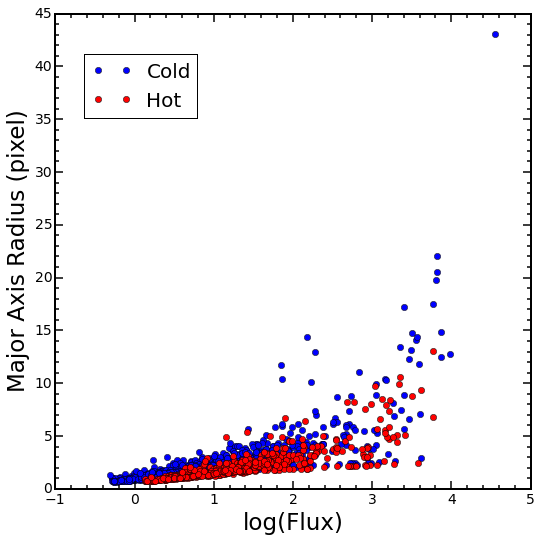

In [87]:
fig = plt.figure(figsize=(8, 8))
fig.subplots_adjust(hspace=0.1, wspace=0.1, 
                    top=0.95, right=0.95)

ax = gca()
fontsize = 14
ax.minorticks_on()

for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)

ax.set_xlabel('log(Flux)',      fontsize=23)
ax.set_ylabel('Major Axis Radius (pixel)', fontsize=23)

ax.plot(np.log10(objCold['cflux']), objCold['a'], 'o', 
        color='b', label='Cold')

ax.plot(np.log10(objHot['cflux']),  objHot['a'], 'o', 
        color='r', label='Hot')

# Put legend on
ax.legend(loc=[0.06, 0.78], fontsize=20)